# Импортируем библиотеки

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/sf-dst-scoring/sample_submission.csv
/kaggle/input/sf-dst-scoring/train.csv
/kaggle/input/sf-dst-scoring/test.csv


In [2]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from datetime import datetime
from scipy.stats import boxcox
from math import log
from math import exp
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from math import sqrt
from itertools import combinations
from scipy.stats import ttest_ind
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
import sklearn
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import f_classif, mutual_info_classif

# Задаём функции

In [3]:
def import_data():
    global train
    global train1
    global test
    path = '/kaggle/input/sf-dst-scoring/'
    train = pd.read_csv(path+'train.csv')
    train1 = train
    test = pd.read_csv(path+'test.csv')

In [4]:
def prepare_df (df):
    # Удалим пропуски
    df.dropna(inplace = True)
    # Обновим индексы, удалим старую колонку индексов
    df.reset_index(inplace = True)
    df.drop('index', axis = 'columns', inplace = True)
    return df

In [5]:
def data_view (df):
    # размер массива
    print('Размер массива {}: {}'.format(df, df.shape))
    print('#############################################################')
    # посмотрим первые 5 строк дата сета
    print('Первые строки дата сета:')
    print(df.head(5))
    print('#############################################################')
    # посмотрим описание данных
    print('Описание данных:')
    print(df.info())
    print('#############################################################')
    # посмотрим значения данных
    print('Значения данных:')
    print(df.describe())
    print('#############################################################')
    # посчитаем количество пропусков
    print('Количество пропусков:')
    print(df.isna().sum())
    print('Что является {}% от общего количества данных (строк)'.format(df.isna().sum().sum()/len(df)*100))
    print('#############################################################')
    # посчитаем количество уникальных значений
    print('Количество уникальных значений:')
    print(df.nunique())

In [6]:
def numeric_eda (df):
    for column in numeric:
        print('Гистограмма признака для всех типов клиентов {}'.format(column))
        fig = px.histogram(df, x=column)
        fig.show()
        print('Гистограмма признака {} для дефолтных клиентов'.format(column))
        fig = px.histogram(df, x=df[column][df['default'] == 1])
        fig.show()
        print('Гистограмма признака {} для не дефолтных клиентов'.format(column))
        fig = px.histogram(df, x=df[column][df['default'] == 0])
        fig.show()
        print('Статистика признака {}'.format(column))
        print(df[column].describe())
        print('Статистика признака {} для дефолтных (default = 1) клиентов'.format(column))
        print(df[column][df['default'] == 1].describe())
        print('Статистика признака {} для не дефолтных (default = 0) клиентов'.format(column))
        print(df[column][df['default'] == 0].describe())
        print('Боксплот признака {} '.format(column))
        fig = px.box(df, y=column)
        fig.show()
        print('Боксплот признака {} разделён по клиентам'.format(column))
        fig = px.box(df, x=df['default'], y=column)
        fig.show()
        print('Топ-10 уникальных значений для признака {}'.format(column))
        print(df[column][df['default'] == 1].value_counts().head(10))
        print('##################################################################################################')
        print('##################################################################################################')
        print('##################################################################################################')

In [7]:
def decline_app_cnt_to_cat (df):
    decline_app_cnt_cat = []
    for i in range (len(df)):
        if df['decline_app_cnt'][i] == 0:
            decline_app_cnt_cat.append(0)
        elif df['decline_app_cnt'][i] == 1:
            decline_app_cnt_cat.append(1)
        elif df['decline_app_cnt'][i] == 2:
            decline_app_cnt_cat.append(2)
        elif df['decline_app_cnt'][i] == 3:
            decline_app_cnt_cat.append(3)
        else:
            decline_app_cnt_cat.append(4)
    decline_app_cnt_cat = pd.Series(decline_app_cnt_cat)
    df['decline_app_cnt_cat'] = decline_app_cnt_cat

In [8]:
def bki_request_cnt_to_cat (df):
    bki_request_cnt_to_cat = []
    for i in range (len(df)):
        if df['bki_request_cnt'][i] == 0:
            bki_request_cnt_to_cat.append(0)
        elif df['bki_request_cnt'][i] == 1:
            bki_request_cnt_to_cat.append(1)
        elif df['bki_request_cnt'][i] == 2:
            bki_request_cnt_to_cat.append(2)
        elif df['bki_request_cnt'][i] == 3:
            bki_request_cnt_to_cat.append(3)
        elif df['bki_request_cnt'][i] == 4:
            bki_request_cnt_to_cat.append(4)
        elif df['bki_request_cnt'][i] == 5:
            bki_request_cnt_to_cat.append(5)            
        else:
            bki_request_cnt_to_cat.append(6)
    bki_request_cnt_to_cat = pd.Series(bki_request_cnt_to_cat)
    df['bki_request_cnt_to_cat'] = bki_request_cnt_to_cat

In [9]:
def income_to_cat (df):
    #global decline_app_cnt_cat
    income_to_cat = []
    for i in range (len(df)):
        if df['income'][i] <= 20000:
            income_to_cat.append(0)
        elif 20000 < df['income'][i] <= 48000:
            income_to_cat.append(1)
        elif 48000 < df['income'][i] <= 90000:
            income_to_cat.append(2)
        else:
            income_to_cat.append(3)
    income_to_cat = pd.Series(income_to_cat)
    df['income_to_cat'] = income_to_cat

In [10]:
def devide_by_feature_type_first ():
    # Числовые переменные:
    global numeric
    numeric = ['age', 'decline_app_cnt', 'bki_request_cnt', 'income', 'score_bki', 'region_rating', 'default']
    # Категориальные
    global categorical
    categorical = ['education', 'home_address', 'work_address', 'sna', 'first_time', 'app_date_month', 'app_date_week_day', 'default']
    # Бинарные
    global binary
    binary = ['sex', 'car', 'car_type', 'good_work', 'foreign_passport', 'app_date_work_day', 'default']

In [11]:
def devide_by_feature_type_second ():
    # Числовые переменные:
    global numeric
    numeric = ['age', 'decline_app_cnt', 'bki_request_cnt', 'income', 'score_bki', 'region_rating', 'default']
    # Категориальные
    global categorical
    categorical = ['education', 'home_address', 'work_address', 'sna', 'first_time', 'app_date_month', 'app_date_week_day', 'default', 
                     'decline_app_cnt_cat', 'bki_request_cnt_to_cat', 'income_to_cat']
    # Бинарные
    global binary
    binary = ['sex', 'car', 'car_type', 'good_work', 'foreign_passport', 'app_date_work_day', 'default']

In [12]:
def data_proc (df):
    app_date = df['app_date']
    
    # Переведём в формат даты, понятный машине
    app_date_proc = []
    for line in app_date:
        app_date_proc.append(datetime.strptime(line, '%d%b%Y'))
    
    # Создадим список, куда запишем месяца:
    app_date_month = []
    # циклом заполним месяца:
    for date in app_date_proc:
        app_date_month.append(date.month)
    
    # По дням недели
    app_date_week_day = []
    for date in app_date_proc:
        app_date_week_day.append(datetime.isoweekday(date))
    
    # Выходные/будни
    app_date_work_day = []
    for week_day in app_date_week_day:
        if week_day != 6 and week_day != 7:
            app_date_work_day.append(1)
        else:
            app_date_work_day.append(0)
    
    # Добавим колонки в исходный ДФ
    df['app_date_month'] = pd.Series(app_date_month)
    df['app_date_week_day'] = pd.Series(app_date_week_day)
    df['app_date_work_day'] = pd.Series(app_date_work_day)

In [13]:
def delete_outliers (df):
    df = df[df['decline_app_cnt'] < 6]
    df = df[df['bki_request_cnt'] < 10]
    df = df[df['income'] < df['income'].describe().loc['75%'] + 1.5 * (df['income'].describe().loc['75%'] - df['income'].describe().loc['25%'])]
    df.reset_index(inplace = True)
    df.drop('index', axis = 'columns')
    return df

In [14]:
def round_income (df):
    # Округлим данные income
    for i in range(len(df)):
        if 0 <= df['income'][i] < 2500:
            df['income'][i] = 1250
        elif 2500 <= df['income'][i] < 7500:
            df['income'][i] = 5000
        elif 7500 <= df['income'][i] < 12500:
            df['income'][i] = 10000
        elif 12500 <= df['income'][i] < 17500:
            df['income'][i] = 15000
        elif 17500 <= df['income'][i] < 22500:
            df['income'][i] = 20000
        elif 22500 <= df['income'][i] < 27500:
            df['income'][i] = 25000
        elif 27500 <= df['income'][i] < 32500:
            df['income'][i] = 30000
        elif 32500 <= df['income'][i] < 37500:
            df['income'][i] = 35000
        elif 37500 <= df['income'][i] < 42500:
            df['income'][i] = 40000
        elif 42500 <= df['income'][i] < 47500:
            df['income'][i] = 45000
        elif 47500 <= df['income'][i] < 52500:
            df['income'][i] = 50000        
        elif 52500 <= df['income'][i] < 57500:
            df['income'][i] = 55000
        elif 57500 <= df['income'][i] < 65000:
            df['income'][i] = 60000
        elif 65000 <= df['income'][i] < 75000:
            df['income'][i] = 70000
        elif 75000 <= df['income'][i] < 85000:
            df['income'][i] = 80000
        elif 85000 <= df['income'][i] < 95000:
            df['income'][i] = 90000
        elif 95000 <= df['income'][i] < 125000:
            df['income'][i] = 100000
        elif 125000 <= df['income'][i] < 175000:
            df['income'][i] = 150000  
        elif 175000 <= df['income'][i] < 225000:
            df['income'][i] = 200000          
        elif 225000 <= df['income'][i] < 275000:
            df['income'][i] = 250000          
        elif 275000 <= df['income'][i] < 325000:
            df['income'][i] = 300000          
        elif 325000 <= df['income'][i] < 375000:
            df['income'][i] = 350000          
        elif 375000 <= df['income'][i] < 450000:
            df['income'][i] = 400000          
        elif 450000 <= df['income'][i] < 550000:
            df['income'][i] = 500000          
        elif 550000 <= df['income'][i] < 650000:
            df['income'][i] = 600000          
        elif 650000 <= df['income'][i] < 750000:
            df['income'][i] = 700000          
        elif 750000 <= df['income'][i] < 850000:
            df['income'][i] = 800000 
        elif 850000 <= df['income'][i] < 950000:
            df['income'][i] = 900000          
        elif 950000 <= df['income'][i]:
            df['income'][i] = 1000000
    return df

In [15]:
def norm_stand_scaler (df):
    column_for_transform = ['age', 'decline_app_cnt', 'bki_request_cnt', 'income', 'score_bki', 'region_rating']
    for column in column_for_transform:
        scaler = MinMaxScaler()
        scaler = scaler.fit(df[column].values.reshape(len(df[column]), 1))
        scaled = scaler.transform(df[column].values.reshape(len(df[column]), 1))
        scaler = StandardScaler()
        scaler = scaler.fit(scaled)
        scaled = scaler.transform(scaled)
        df[column] = pd.DataFrame(scaled)
    return df

In [16]:
def get_stat_dif(column):
    cols = to_stat.loc[:, column].value_counts().index[:10]
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        if ttest_ind(to_stat.loc[to_stat.loc[:, column] == comb[0], 'default'], 
                        to_stat.loc[to_stat.loc[:, column] == comb[1], 'default'], nan_policy = 'omit').pvalue \
            <= 0.05/len(combinations_all): # Учли поправку Бонферони
            print( 'Найдены статистически значимые различия для колонки', column )
            break

In [17]:
def categorical_edu (df):
    global to_stat
    to_stat = df
    for column in df:
        print('Обзор данных признака {}'.format(column))
        print('Гистограмма распределения признака {}'.format(column))
        fig = px.histogram(df, x=column)
        fig.show()
        print('Гистограмма распределения признака {} относительно "default"'.format(column))
        fig = go.Figure(data=[
        go.Bar(name='default 0', x=df[column][df['default'] == 0].value_counts().keys(), y=df[column][df['default'] == 0].value_counts().values),
        go.Bar(name='default 1', x=df[column][df['default'] == 1].value_counts().keys(), y=df[column][df['default'] == 1].value_counts().values)
            ])
        fig.show()
        get_stat_dif(column)
        print('#############################################################')

In [18]:
def model_parameters (model):
    global y_pred
    global y_pred_proba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)
    print('Метрика f1_score по крос-валидации:')
    print(np.median(cross_val_score(model, X_test, Y_test, cv=10, scoring = 'f1')))
    print('Метрика recall по крос-валидации:')
    print(np.median(cross_val_score(model, X_test, Y_test, cv=10, scoring = 'recall')))
    print('Матрица ошибок')
    print(confusion_matrix(Y_test, y_pred))
    print('Отчет по классификации')
    print(classification_report(Y_test, y_pred))

In [19]:
def test_proc (df):
    global test
    #prepare_df(df)
    data_proc(df)
    decline_app_cnt_to_cat(df)
    bki_request_cnt_to_cat(df)
    income_to_cat(df)
    #df = delete_outliers(df)
    df = round_income(df)
    df['age']            , lmbda_age             = boxcox(df['age'])
    df['income']         ,lmbda_decline_app_cnt  = boxcox(df['income'])
    #df['bki_request_cnt'], lmbda_bki_request_cnt = boxcox(df['bki_request_cnt']+1)
    df = norm_stand_scaler(df)
    test = df
    numeric = ['age', 'decline_app_cnt', 'bki_request_cnt', 'income', 'score_bki', 'region_rating']
    categorical = ['education', 'home_address', 'work_address', 'sna', 'first_time', 'app_date_month', 'app_date_week_day']
    binary = ['sex', 'car', 'car_type', 'good_work', 'foreign_passport', 'app_date_work_day']
    dummy_cat = pd.get_dummies(df[categorical], columns = categorical)
    dummy_bin = pd.get_dummies(df[binary], columns = binary)
    global X_sub
    X_sub = df[numeric]
    X_sub = X_sub.join(dummy_cat)
    X_sub = X_sub.join(dummy_bin)
    return X_sub

Фиксируем рандом

In [20]:
RANDOM_SEED = 42
!pip freeze > requirements.txt

# Загружаем данные в переменные

In [21]:
import_data()

# Посмотрим данные

client_id - идентификатор клиента  
education - уровень образования  
sex - пол заемщика  
age - возраст заемщика  
car - флаг наличия автомобиля  
car_type - флаг автомобиля иномарки  
decline_app_cnt - количество отказанных прошлых заявок  
good_work - флаг наличия “хорошей” работы  
bki_request_cnt - количество запросов в БКИ  
home_address - категоризатор домашнего адреса  
work_address - категоризатор рабочего адреса  
income - доход заемщика  
foreign_passport - наличие загранпаспорта  
sna - связь заемщика с клиентами банка  
first_time - давность наличия информации о заемщике  
score_bki - скоринговый балл по данным из БКИ  
region_rating - рейтинг региона  
app_date - дата подачи заявки  
default - флаг дефолта по кредиту  

In [22]:
data_view(train)

Размер массива        client_id   app_date education sex  age car car_type  decline_app_cnt  \
0          25905  01FEB2014       SCH   M   62   Y        Y                0   
1          63161  12MAR2014       SCH   F   59   N        N                0   
2          25887  01FEB2014       SCH   M   25   Y        N                2   
3          16222  23JAN2014       SCH   F   53   N        N                0   
4         101655  18APR2014       GRD   M   48   N        N                0   
...          ...        ...       ...  ..  ...  ..      ...              ...   
73794      54887  04MAR2014       GRD   F   45   N        N                0   
73795      76821  24MAR2014       SCH   M   41   Y        Y                0   
73796     103695  22APR2014       SCH   M   31   N        N                0   
73797        861  04JAN2014       SCH   F   29   N        N                0   
73798      15796  23JAN2014       GRD   M   34   N        N                0   

       good_work  score_

In [23]:
prepare_df(train)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default
0,25905,01FEB2014,SCH,M,62,Y,Y,0,0,-2.008753,1,50,1,2,18000,4,1,N,0
1,63161,12MAR2014,SCH,F,59,N,N,0,0,-1.532276,3,50,2,3,19000,4,1,N,0
2,25887,01FEB2014,SCH,M,25,Y,N,2,0,-1.408142,1,80,1,2,30000,1,4,Y,0
3,16222,23JAN2014,SCH,F,53,N,N,0,0,-2.057471,2,50,2,3,10000,1,3,N,0
4,101655,18APR2014,GRD,M,48,N,N,0,1,-1.244723,1,60,2,3,30000,1,4,Y,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73487,54887,04MAR2014,GRD,F,45,N,N,0,0,-1.792064,3,50,1,2,17000,4,4,N,0
73488,76821,24MAR2014,SCH,M,41,Y,Y,0,0,-2.058029,1,50,2,2,70000,1,4,N,0
73489,103695,22APR2014,SCH,M,31,N,N,0,0,-1.512635,4,80,2,3,45000,2,2,N,0
73490,861,04JAN2014,SCH,F,29,N,N,0,1,-1.479334,3,50,1,3,13000,2,3,N,1


***Таким образом данные можно считать подготовленными для дальнейшего анализа***  
Данные предварительно можно разделить на 3 типа:  
Числовые, категориальные, бинарные.  
Дополнительно стоит отметить, что имеются данные, с которыми нужно будет поработать и сделать еще несколько признаков:  
app_date - дата подачи заявки.


**Проработаем колонку app_date, чтобы получить из неё некоторые признаки**  
Данные с 1 по 4 месяцы 2014 года  
Есть только дата и нет времени  
Проведем процессинг данных и получим колонки с месяцем, днём, и флаг является-ли день рабочим

In [24]:
data_proc(train)

Разделение по типам данных

In [25]:
devide_by_feature_type_first()

# Перейдем к анализу числовых переменных

In [26]:
numeric_eda(train[numeric])

Гистограмма признака для всех типов клиентов age


Гистограмма признака age для дефолтных клиентов


Гистограмма признака age для не дефолтных клиентов


Статистика признака age
count    73492.000000
mean        39.270383
std         11.520214
min         21.000000
25%         30.000000
50%         37.000000
75%         48.000000
max         72.000000
Name: age, dtype: float64
Статистика признака age для дефолтных (default = 1) клиентов
count    9337.000000
mean       38.517618
std        11.497920
min        21.000000
25%        29.000000
50%        36.000000
75%        47.000000
max        72.000000
Name: age, dtype: float64
Статистика признака age для не дефолтных (default = 0) клиентов
count    64155.000000
mean        39.379939
std         11.519445
min         21.000000
25%         30.000000
50%         38.000000
75%         48.000000
max         71.000000
Name: age, dtype: float64
Боксплот признака age 


Боксплот признака age разделён по клиентам


Топ-10 уникальных значений для признака age
26    375
30    369
29    369
28    362
27    362
31    347
33    324
32    321
25    312
35    293
Name: age, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################
Гистограмма признака для всех типов клиентов decline_app_cnt


Гистограмма признака decline_app_cnt для дефолтных клиентов


Гистограмма признака decline_app_cnt для не дефолтных клиентов


Статистика признака decline_app_cnt
count    73492.000000
mean         0.276465
std          0.805463
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         33.000000
Name: decline_app_cnt, dtype: float64
Статистика признака decline_app_cnt для дефолтных (default = 1) клиентов
count    9337.000000
mean        0.516119
std         1.138155
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max        22.000000
Name: decline_app_cnt, dtype: float64
Статистика признака decline_app_cnt для не дефолтных (default = 0) клиентов
count    64155.000000
mean         0.241587
std          0.738312
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         33.000000
Name: decline_app_cnt, dtype: float64
Боксплот признака decline_app_cnt 


Боксплот признака decline_app_cnt разделён по клиентам


Топ-10 уникальных значений для признака decline_app_cnt
0    6677
1    1573
2     600
3     245
4     120
5      43
6      34
7      14
8      10
9       9
Name: decline_app_cnt, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################
Гистограмма признака для всех типов клиентов bki_request_cnt


Гистограмма признака bki_request_cnt для дефолтных клиентов


Гистограмма признака bki_request_cnt для не дефолтных клиентов


Статистика признака bki_request_cnt
count    73492.000000
mean         2.001238
std          2.252317
min          0.000000
25%          0.000000
50%          1.000000
75%          3.000000
max         53.000000
Name: bki_request_cnt, dtype: float64
Статистика признака bki_request_cnt для дефолтных (default = 1) клиентов
count    9337.000000
mean        2.465032
std         2.727538
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        46.000000
Name: bki_request_cnt, dtype: float64
Статистика признака bki_request_cnt для не дефолтных (default = 0) клиентов
count    64155.000000
mean         1.933739
std          2.166278
min          0.000000
25%          0.000000
50%          1.000000
75%          3.000000
max         53.000000
Name: bki_request_cnt, dtype: float64
Боксплот признака bki_request_cnt 


Боксплот признака bki_request_cnt разделён по клиентам


Топ-10 уникальных значений для признака bki_request_cnt
1    2165
0    1828
2    1810
3    1335
4     851
5     554
6     278
7     134
8      97
9      58
Name: bki_request_cnt, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################
Гистограмма признака для всех типов клиентов income


Гистограмма признака income для дефолтных клиентов


Гистограмма признака income для не дефолтных клиентов


Статистика признака income
count      73492.000000
mean       41085.328321
std        46050.474530
min         1000.000000
25%        20000.000000
50%        30000.000000
75%        48000.000000
max      1000000.000000
Name: income, dtype: float64
Статистика признака income для дефолтных (default = 1) клиентов
count      9337.000000
mean      36305.044233
std       40052.158352
min        3700.000000
25%       20000.000000
50%       28000.000000
75%       40000.000000
max      830000.000000
Name: income, dtype: float64
Статистика признака income для не дефолтных (default = 0) клиентов
count      64155.000000
mean       41781.042023
std        46819.107233
min         1000.000000
25%        20000.000000
50%        30000.000000
75%        50000.000000
max      1000000.000000
Name: income, dtype: float64
Боксплот признака income 


Боксплот признака income разделён по клиентам


Топ-10 уникальных значений для признака income
30000    874
25000    830
20000    805
35000    597
15000    592
40000    578
50000    433
45000    308
18000    302
60000    223
Name: income, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################
Гистограмма признака для всех типов клиентов score_bki


Гистограмма признака score_bki для дефолтных клиентов


Гистограмма признака score_bki для не дефолтных клиентов


Статистика признака score_bki
count    73492.000000
mean        -1.904534
std          0.498249
min         -3.624586
25%         -2.259407
50%         -1.920823
75%         -1.569545
max          0.199773
Name: score_bki, dtype: float64
Статистика признака score_bki для дефолтных (default = 1) клиентов
count    9337.000000
mean       -1.676370
std         0.494581
min        -3.456086
25%        -2.016378
50%        -1.684366
75%        -1.338916
max         0.199773
Name: score_bki, dtype: float64
Статистика признака score_bki для не дефолтных (default = 0) клиентов
count    64155.000000
mean        -1.937741
std          0.490007
min         -3.624586
25%         -2.284543
50%         -1.956772
75%         -1.609254
max          0.199773
Name: score_bki, dtype: float64
Боксплот признака score_bki 


Боксплот признака score_bki разделён по клиентам


Топ-10 уникальных значений для признака score_bki
-1.775263    40
-2.225004    30
-2.104211    27
-2.387268    24
-1.920823    20
-2.169664    18
-2.447239    13
-2.024100    13
-1.526422    11
-2.353052    10
Name: score_bki, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################
Гистограмма признака для всех типов клиентов region_rating


Гистограмма признака region_rating для дефолтных клиентов


Гистограмма признака region_rating для не дефолтных клиентов


Статистика признака region_rating
count    73492.000000
mean        56.710798
std         13.043377
min         20.000000
25%         50.000000
50%         50.000000
75%         60.000000
max         80.000000
Name: region_rating, dtype: float64
Статистика признака region_rating для дефолтных (default = 1) клиентов
count    9337.000000
mean       53.679983
std        11.914774
min        20.000000
25%        50.000000
50%        50.000000
75%        60.000000
max        80.000000
Name: region_rating, dtype: float64
Статистика признака region_rating для не дефолтных (default = 0) клиентов
count    64155.000000
mean        57.151898
std         13.141537
min         20.000000
25%         50.000000
50%         50.000000
75%         70.000000
max         80.000000
Name: region_rating, dtype: float64
Боксплот признака region_rating 


Боксплот признака region_rating разделён по клиентам


Топ-10 уникальных значений для признака region_rating
50    3735
60    2063
40    2032
80     835
70     572
30      56
20      44
Name: region_rating, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################
Гистограмма признака для всех типов клиентов default


Гистограмма признака default для дефолтных клиентов


Гистограмма признака default для не дефолтных клиентов


Статистика признака default
count    73492.000000
mean         0.127048
std          0.333029
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: default, dtype: float64
Статистика признака default для дефолтных (default = 1) клиентов
count    9337.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: default, dtype: float64
Статистика признака default для не дефолтных (default = 0) клиентов
count    64155.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: default, dtype: float64
Боксплот признака default 


Боксплот признака default разделён по клиентам


Топ-10 уникальных значений для признака default
1    9337
Name: default, dtype: int64
##################################################################################################
##################################################################################################
##################################################################################################


Перед анализом категориальных признаков предлагается на основании цифровых признаков сделать категориальные и добавить их в соответствующий ДФ

Наибольшее количество значений собрано в районе значений меньше 3  
Таким образом, для decline_app_cnt создадим переменную, где 0 - 0 отказов, 1 - 1 отказ, 2 - 2 отказа, 3 - 3 отказа, 4 - более 3х отказов

In [27]:
decline_app_cnt_to_cat(train)

Наибольшее количество значений собрано в районе значений меньше 5 Таким образом, для decline_app_cnt создадим переменную, где 0 - 0 обращений, 1 - 1 обращение, 2 - 2 обращения, 3 - 3 обращения, 4 - 4 обращения, 5 - 5 обращений, 6 - больше 5 обращений

In [28]:
bki_request_cnt_to_cat(train)

Для переменной income отмечается длинный правый хвост. Наибольшее количество значений собрано в районе значений меньше 27000 Таким образом, для income создадим переменную, где 0 - доход меньше 20к, 1 - 20 - 48к, 2 - 48 - 90к, 3 больше 90к

In [29]:
income_to_cat(train)

Так как распределение числовых переменных, как правило имеет длинный правый хвост стоит поработать в первую очередь над выбросами
Так для переменных decline_app_cnt и bki_request удалим вылеты, значения больше 6 и больше 10 соответственно
Для переменной income удалим значения больше 1.5 межквартильного размаха

In [30]:
train = delete_outliers(train)

и округлим значения с шагом 5 тысяч в интервале 0 - 70, с шагом 10 в интервале 70 - 100, с шагом 50 в интервале 100 - 1000000

In [31]:
train = round_income(train)

Посмотрим как изменилось распределение

Данные выглядят лучше. Хвосты остались, но уже не такие длинные.  

Посмотрим корреляцию признаков

In [33]:
corr = train[numeric].corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(3)

,age,decline_app_cnt,bki_request_cnt,income,score_bki,region_rating,default
age,1.000,-0.120,0.047,-0.128,-0.111,-0.094,-0.027
decline_app_cnt,-0.120,1.000,0.100,-0.006,0.184,-0.032,0.115
bki_request_cnt,0.047,0.100,1.000,0.062,0.123,-0.012,0.067
income,-0.128,-0.006,0.062,1.000,0.012,0.307,-0.053
score_bki,-0.111,0.184,0.123,0.012,1.000,0.020,0.171
region_rating,-0.094,-0.032,-0.012,0.307,0.020,1.000,-0.081
default,-0.027,0.115,0.067,-0.053,0.171,-0.081,1.000


Высоких корреляций между принзаками нет.

# Применим к признакам силовые преобразования.  
Преобразовывать будем колонки age, income, bki_request_cnt. 

In [34]:
train['age']            , lmbda_age             = boxcox(train['age'])
train['income']         ,lmbda_decline_app_cnt  = boxcox(train['income'])
#train['bki_request_cnt'], lmbda_bki_request_cnt = boxcox(train['bki_request_cnt']+1)

Построим гистограммы

In [35]:
print('распределение после преобразования для age')
fig = px.histogram(train, x='age')
fig.show()
print('распределение после преобразования для income')
fig = px.histogram(train, x='income')
fig.show()
#print('распределение после преобразования для bki_request_cnt')
#fig = px.histogram(train, x='bki_request_cnt')
#fig.show()

распределение после преобразования для age


распределение после преобразования для income


В большинстве случаев распределение стало более нормальным

Проведем нормирование и центрирование данных

In [36]:
train = norm_stand_scaler(train)

# Проанализируем категориальные и бинарные переменные

In [37]:
categorical_edu(train[categorical])

Обзор данных признака education
Гистограмма распределения признака education


Гистограмма распределения признака education относительно "default"


Найдены статистически значимые различия для колонки education
#############################################################
Обзор данных признака home_address
Гистограмма распределения признака home_address


Гистограмма распределения признака home_address относительно "default"


Найдены статистически значимые различия для колонки home_address
#############################################################
Обзор данных признака work_address
Гистограмма распределения признака work_address


Гистограмма распределения признака work_address относительно "default"


Найдены статистически значимые различия для колонки work_address
#############################################################
Обзор данных признака sna
Гистограмма распределения признака sna


Гистограмма распределения признака sna относительно "default"


Найдены статистически значимые различия для колонки sna
#############################################################
Обзор данных признака first_time
Гистограмма распределения признака first_time


Гистограмма распределения признака first_time относительно "default"


Найдены статистически значимые различия для колонки first_time
#############################################################
Обзор данных признака app_date_month
Гистограмма распределения признака app_date_month


Гистограмма распределения признака app_date_month относительно "default"


Найдены статистически значимые различия для колонки app_date_month
#############################################################
Обзор данных признака app_date_week_day
Гистограмма распределения признака app_date_week_day


Гистограмма распределения признака app_date_week_day относительно "default"


#############################################################
Обзор данных признака default
Гистограмма распределения признака default


Гистограмма распределения признака default относительно "default"


Найдены статистически значимые различия для колонки default
#############################################################


Сделаем то же самое для бинарных переменных

In [38]:
categorical_edu(train[binary])

Обзор данных признака sex
Гистограмма распределения признака sex


Гистограмма распределения признака sex относительно "default"


Найдены статистически значимые различия для колонки sex
#############################################################
Обзор данных признака car
Гистограмма распределения признака car


Гистограмма распределения признака car относительно "default"


Найдены статистически значимые различия для колонки car
#############################################################
Обзор данных признака car_type
Гистограмма распределения признака car_type


Гистограмма распределения признака car_type относительно "default"


Найдены статистически значимые различия для колонки car_type
#############################################################
Обзор данных признака good_work
Гистограмма распределения признака good_work


Гистограмма распределения признака good_work относительно "default"


Найдены статистически значимые различия для колонки good_work
#############################################################
Обзор данных признака foreign_passport
Гистограмма распределения признака foreign_passport


Гистограмма распределения признака foreign_passport относительно "default"


Найдены статистически значимые различия для колонки foreign_passport
#############################################################
Обзор данных признака app_date_work_day
Гистограмма распределения признака app_date_work_day


Гистограмма распределения признака app_date_work_day относительно "default"


#############################################################
Обзор данных признака default
Гистограмма распределения признака default


Гистограмма распределения признака default относительно "default"


Найдены статистически значимые различия для колонки default
#############################################################


# Начнем подготовку данных для модели

Переведём в dummy категориальные переменные

In [39]:
numeric = ['age', 'decline_app_cnt', 'bki_request_cnt', 'income', 'score_bki', 'region_rating']
categorical = ['education', 'home_address', 'work_address', 'sna', 'first_time', 'app_date_month', 'app_date_week_day']
binary = ['sex', 'car', 'car_type', 'good_work', 'foreign_passport', 'app_date_work_day']

In [40]:
dummy_cat = pd.get_dummies(train[categorical], columns = categorical)
dummy_bin = pd.get_dummies(train[binary], columns = binary)

Соберём датасеты для обучения

In [41]:
Y = train['default']
X = train[numeric]
X = X.join(dummy_cat)
X = X.join(dummy_bin)

Сбалансируем данные путем уменьшения числа превосходящего класса

In [42]:
X_us, Y_us = RandomUnderSampler().fit_resample(X, Y)

Разделим данные на обучающие и валидационные.
Так как выборка не сбалансирована укажем при разделении датасета, что пропорция должна соблюдаться.

In [43]:
X_train, X_test, Y_train, Y_test = train_test_split(X_us, Y_us, test_size = 0.3, stratify = Y_us)

# Начнём обучать модель

Обучим первую модель без настроек. Для оценки качества будем использовать полноту и f1-score. Валидировать будем крос-валидацией.  

Метрика f1_score по крос-валидации:
0.6581866930854996
Метрика recall по крос-валидации:
0.6434108527131783
Матрица ошибок
[[1715  870]
 [ 872 1714]]
Отчет по классификации
              precision    recall  f1-score   support

           0       0.66      0.66      0.66      2585
           1       0.66      0.66      0.66      2586

    accuracy                           0.66      5171
   macro avg       0.66      0.66      0.66      5171
weighted avg       0.66      0.66      0.66      5171

Метрика roc_auc по крос-валидации:
0.7205459060312254


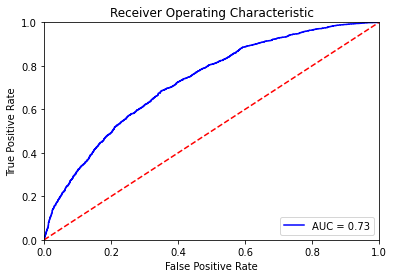

In [44]:
model_first = LogisticRegression().fit(X_train, Y_train)
model_parameters(model_first)
# roc_auc - далее как метрика использоваться не будет, ввиду ее неинформативности
print('Метрика roc_auc по крос-валидации:')
print(np.median(cross_val_score(model_first, X_test, Y_test, cv=10, scoring = 'roc_auc')))
fpr, tpr, treshold = metrics.roc_curve(Y_test, y_pred_proba[:, 1])
roc_auc = metrics.auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

При первом обучении модели, как видно из приведенных метрик, полнота и f1-score очень низкие. 
roc_auc не описывает качество модели, дальше её использовать не будем.
Начнем устанавливать свойства модели. Укажем, что веса классов должны быть сбалансированы.

In [45]:
model_bal = LogisticRegression(class_weight='balanced')
model_bal.fit(X_train, Y_train)
model_parameters(model_bal)

Метрика f1_score по крос-валидации:
0.6581866930854996
Метрика recall по крос-валидации:
0.6434108527131783
Матрица ошибок
[[1713  872]
 [ 870 1716]]
Отчет по классификации
              precision    recall  f1-score   support

           0       0.66      0.66      0.66      2585
           1       0.66      0.66      0.66      2586

    accuracy                           0.66      5171
   macro avg       0.66      0.66      0.66      5171
weighted avg       0.66      0.66      0.66      5171



После балансировки классов получили незначительный прирост полноты и f1
Далее попробуем установить штрафы модели. Для этого воспользуемся алгоритмом оптимизации

In [46]:
C = np.logspace(0, 10, 10)
penalty = ['l1', 'l2']
hyperparameters = dict(C=C, penalty=penalty)#, solver = solver)
model = LogisticRegression(class_weight="balanced")
model.fit(X_train, Y_train)
classifier = GridSearchCV(model, hyperparameters, cv=10, verbose=0, scoring = 'f1')
best_model = classifier.fit(X_train, Y_train)
print('Лучший penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Лучшее C:', best_model.best_estimator_.get_params()['C'])

Лучший penalty: l2
Лучшее C: 12.91549665014884


Установим параметры модели  
Обучим модель

In [47]:
final_model = LogisticRegression(class_weight="balanced", penalty='l2', C=166.8100537200593, max_iter = 1000)
final_model.fit(X_train, Y_train)
model_parameters(final_model)

Метрика f1_score по крос-валидации:
0.6581866930854996
Метрика recall по крос-валидации:
0.6434108527131783
Матрица ошибок
[[1715  870]
 [ 871 1715]]
Отчет по классификации
              precision    recall  f1-score   support

           0       0.66      0.66      0.66      2585
           1       0.66      0.66      0.66      2586

    accuracy                           0.66      5171
   macro avg       0.66      0.66      0.66      5171
weighted avg       0.66      0.66      0.66      5171



Вторая модель выглядит самой успешной, однако разница с моделью после подбора признаков незначительная. В конечном итоге будем использовать последнюю модель.

# Отправим submision

Подготовим данные из тестового датасета

In [48]:
test_proc(test)

,age,decline_app_cnt,bki_request_cnt,income,score_bki,region_rating,education_ACD,education_GRD,education_PGR,education_SCH,...,car_N,car_Y,car_type_N,car_type_Y,good_work_0,good_work_1,foreign_passport_N,foreign_passport_Y,app_date_work_day_0,app_date_work_day_1
0,-0.879805,-0.339951,0.429096,0.699337,-0.732887,-0.519845,0,1,0,0,...,0,1,0,1,1,0,1,0,1,0
1,0.142171,6.001464,-0.006301,-2.815562,0.795510,-0.519845,0,0,0,1,...,1,0,1,0,1,0,1,0,0,1
2,0.979411,-0.339951,-0.441697,-0.017427,0.424136,-0.519845,0,0,0,0,...,0,1,0,1,1,0,0,1,1,0
3,1.355399,-0.339951,-0.441697,-1.045521,-0.936769,-1.283994,0,0,0,1,...,1,0,1,0,1,0,1,0,0,1
4,0.053605,-0.339951,-0.877093,1.619561,-1.162615,1.772599,0,1,0,0,...,1,0,1,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36344,-0.037529,0.928332,0.429096,-1.045521,0.317238,-0.519845,0,0,0,1,...,1,0,1,0,1,0,1,0,0,1
36345,1.793740,-0.339951,0.429096,2.482895,-0.776530,0.244303,0,1,0,0,...,0,1,0,1,1,0,1,0,0,1
36346,-0.647477,2.196615,-0.441697,0.947108,1.920053,-0.519845,0,1,0,0,...,1,0,1,0,1,0,1,0,1,0
36347,-1.130223,0.928332,-0.006301,-0.017427,1.318886,1.772599,0,0,0,0,...,1,0,1,0,1,0,1,0,0,1


In [49]:
y_pred_prob = final_model.predict_proba(X_sub)[:,1]
submit = pd.DataFrame(test.client_id)
submit['default'] = y_pred_prob
submit.to_csv('submission_us_1.csv', index=False)
submit

,client_id,default
0,74835,0.222255
1,17527,0.811758
2,75683,0.333831
3,26883,0.407986
4,28862,0.165105
...,...,...
36344,83775,0.770550
36345,106254,0.084637
36346,81852,0.774459
36347,1971,0.593106
